# GAN

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import transforms

/home/sonukiller/miniconda3/envs/catvton/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### Data

In [3]:
BATCH_SIZE = 128
EPOCHS = 10
LATENT = 100
LR = 1e-3

In [4]:
# transform
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Normalize((0.5,), (0.5))])
# dataset
dataset = torchvision.datasets.MNIST(root="data", train=True, download=False, transform=transform)

# dataloader
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

### Generator

In [5]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        # 1xLATENT => 4x4x128
        self.latent_layer = nn.Linear(LATENT, 4*4*128)
        self.model = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=7, stride=2),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.1, True),
            nn.ConvTranspose2d(64, 32, kernel_size=7, stride=2),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.1, True),
            nn.Conv2d(32, 1, kernel_size=7, stride=1, padding=2),
            nn.Tanh())

    def forward(self, x):
        x = self.latent_layer(x)
        x = x.view(-1, 128, 4, 4)
        x = self.model(x)
        x = nn.functional.interpolate(x, size=(28, 28), mode='bilinear', align_corners=False)
        return x

In [6]:
generator = Generator().to(device)
g_optim = torch.optim.Adam(generator.parameters(), lr=LR, betas=(0.5, 0.999))

### Discriminator

In [7]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=7),
            nn.BatchNorm2d(8),
            nn.ReLU(True),
            nn.Dropout2d(0.3),
            nn.Conv2d(8, 32, kernel_size=7),
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.Dropout2d(0.2),
            nn.Conv2d(32, 64, kernel_size=7),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.Conv2d(64, 1, kernel_size=7),
            nn.ReLU(True),
        )
        self.linear = nn.Linear(16, 1)
    def forward(self, x):
        x = self.model(x)
        x = x.view(-1, 16)
        out = nn.functional.sigmoid(self.linear(x))
        return out

In [8]:
discriminator = Discriminator().to(device)
d_optim = torch.optim.Adam(discriminator.parameters(), lr=LR, betas=(0.5, 0.999))

### Training

In [9]:
loss = torch.nn.BCELoss()
img_list = []

In [10]:
for epoch in range(EPOCHS):
    for i, (images, labels) in enumerate(dataloader):
        images = images.to(device)
        
        # discriminator
        noise = torch.randn((BATCH_SIZE, 100), device=device)
        d_optim.zero_grad()
        fake_imgs = generator(noise)
        fake_labels = torch.zeros((BATCH_SIZE, 1), device=device)
        fake_pred = discriminator(fake_imgs.detach())
        fake_loss = loss(fake_pred, fake_labels)
        real_labels = torch.ones((BATCH_SIZE, 1), device=device)
        real_pred = discriminator(images)
        real_loss = loss(real_pred, real_labels)
        d_loss = real_loss + fake_loss
        d_loss.backward()
        d_optim.step()

        # generator
        g_optim.zero_grad()
        g_labels = torch.ones((BATCH_SIZE, 1), device=device)
        g_pred = discriminator(fake_imgs)
        g_loss = loss(g_pred, g_labels)
        g_loss.backward()
        g_optim.step()

        if i%100==0:
            with torch.no_grad():
                img_list.append(np.transpose(torchvision.utils.make_grid(fake_imgs,
                                                                         padding=2,
                                                                         normalize=True).cpu(),(1,2,0)))

    print(f"epoch:{epoch} | d_loss:{d_loss.item()} | g_loss:{g_loss.item()}, ")

epoch:0 | d_loss:1.2730872631072998 | g_loss:0.8775628209114075, 
epoch:1 | d_loss:1.212796688079834 | g_loss:0.6406408548355103, 
epoch:2 | d_loss:0.8422267436981201 | g_loss:0.9253711700439453, 
epoch:3 | d_loss:0.3668519854545593 | g_loss:1.2956492900848389, 
epoch:4 | d_loss:1.431441068649292 | g_loss:0.9285171031951904, 
epoch:5 | d_loss:0.4865397810935974 | g_loss:0.9713284969329834, 
epoch:6 | d_loss:1.4421578645706177 | g_loss:0.9580317735671997, 
epoch:7 | d_loss:1.3961443901062012 | g_loss:0.7971784472465515, 
epoch:8 | d_loss:1.3874602317810059 | g_loss:0.7277884483337402, 
epoch:9 | d_loss:1.386373519897461 | g_loss:0.7020539045333862, 


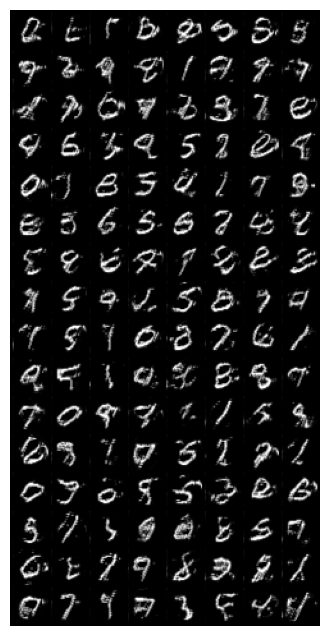

In [11]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(i, animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())